Notebook taken from https://github.com/nageshsinghc4/Exoplanet-exploration

# Exoplanet exploration using Machine Learning


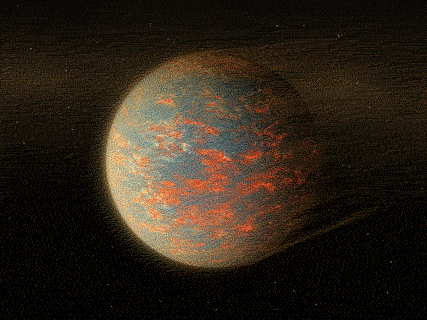

## What are exoplanets?

Exoplanets are planets beyond our own solar system. Thousands have been discovered in the past two decades, mostly with NASA’s Kepler Space Telescope.

These exoplanets come in a huge variety of sizes and orbits. Some are gigantic planets hugging close to their parent stars; others are icy, some rocky. NASA and other agencies are looking for a special kind of planet: one that’s the same size as Earth, orbiting a sun-like star in the habitable zone.


The habitable zone is the area around a star where it is not too hot and not too cold for liquid water to exist on the surface of surrounding planets. Imagine if Earth was where Pluto is. The Sun would be barely visible (about the size of a pea) and Earth’s ocean and much of its atmosphere would freeze.

You can also check out my article to understand more about exoplanets at [www.theaidream.com](https://www.theaidream.com/post/exoplanet-exploration-using-machine-learning)

### Load all the required libraries

In [1]:
import os
import warnings
import math
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
from pylab import rcParams
rcParams['figure.figsize'] = 10, 6
from sklearn.metrics import mean_squared_error, mean_absolute_error
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split 
from sklearn import linear_model
#from sklearn.metrics import recall_score, precision_score, classification_report,accuracy_score,confusion_matrix , roc_curve, auc, roc_curve,accuracy_score,plot_confusion_matrix
from sklearn.preprocessing import StandardScaler, normalize
from scipy import ndimage
import seaborn as sns


In [2]:
from sklearn.metrics import recall_score, precision_score, classification_report,accuracy_score ,confusion_matrix , roc_curve, auc, roc_curve,accuracy_score#, plot_confusion_matrix


### Load the train and test data.

In [3]:
#LABEL -> 2 is an exoplanet star and 1 is a non-exoplanet-star.
#FLUX1-FLUX3197 -> the light intensity recorded for each star, at a different point in time.

#Both the test data nd the training data has labels from before. 


In [4]:
test_data = pd.read_csv('/home/sagarika/belgrade/astrobio/Exoplanet-exploration/exoTest.csv')
train_data = pd.read_csv('/home/sagarika/belgrade/astrobio/Exoplanet-exploration/exoTrain.csv')

In [5]:
train_data

,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
0,2,93.85,83.81,20.10,-26.98,-39.56,-124.71,-135.18,-96.27,-79.89,...,-78.07,-102.15,-102.15,25.13,48.57,92.54,39.32,61.42,5.08,-39.54
1,2,-38.88,-33.83,-58.54,-40.09,-79.31,-72.81,-86.55,-85.33,-83.97,...,-3.28,-32.21,-32.21,-24.89,-4.86,0.76,-11.70,6.46,16.00,19.93
2,2,532.64,535.92,513.73,496.92,456.45,466.00,464.50,486.39,436.56,...,-71.69,13.31,13.31,-29.89,-20.88,5.06,-11.80,-28.91,-70.02,-96.67
3,2,326.52,347.39,302.35,298.13,317.74,312.70,322.33,311.31,312.42,...,5.71,-3.73,-3.73,30.05,20.03,-12.67,-8.77,-17.31,-17.35,13.98
4,2,-1107.21,-1112.59,-1118.95,-1095.10,-1057.55,-1034.48,-998.34,-1022.71,-989.57,...,-594.37,-401.66,-401.66,-357.24,-443.76,-438.54,-399.71,-384.65,-411.79,-510.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5082,1,-91.91,-92.97,-78.76,-97.33,-68.00,-68.24,-75.48,-49.25,-30.92,...,139.95,147.26,156.95,155.64,156.36,151.75,-24.45,-17.00,3.23,19.28
5083,1,989.75,891.01,908.53,851.83,755.11,615.78,595.77,458.87,492.84,...,-26.50,-4.84,-76.30,-37.84,-153.83,-136.16,38.03,100.28,-45.64,35.58
5084,1,273.39,278.00,261.73,236.99,280.73,264.90,252.92,254.88,237.60,...,-26.82,-53.89,-48.71,30.99,15.96,-3.47,65.73,88.42,79.07,79.43
5085,1,3.82,2.09,-3.29,-2.88,1.66,-0.75,3.85,-0.03,3.28,...,10.86,-3.23,-5.10,-4.61,-9.82,-1.50,-4.65,-14.55,-6.41,-2.55


In [6]:
test_data

,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
0,2,119.88,100.21,86.46,48.68,46.12,39.39,18.57,6.98,6.63,...,14.52,19.29,14.44,-1.62,13.33,45.50,31.93,35.78,269.43,57.72
1,2,5736.59,5699.98,5717.16,5692.73,5663.83,5631.16,5626.39,5569.47,5550.44,...,-581.91,-984.09,-1230.89,-1600.45,-1824.53,-2061.17,-2265.98,-2366.19,-2294.86,-2034.72
2,2,844.48,817.49,770.07,675.01,605.52,499.45,440.77,362.95,207.27,...,17.82,-51.66,-48.29,-59.99,-82.10,-174.54,-95.23,-162.68,-36.79,30.63
3,2,-826.00,-827.31,-846.12,-836.03,-745.50,-784.69,-791.22,-746.50,-709.53,...,122.34,93.03,93.03,68.81,9.81,20.75,20.25,-120.81,-257.56,-215.41
4,2,-39.57,-15.88,-9.16,-6.37,-16.13,-24.05,-0.90,-45.20,-5.04,...,-37.87,-61.85,-27.15,-21.18,-33.76,-85.34,-81.46,-61.98,-69.34,-17.84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565,1,374.46,326.06,319.87,338.23,251.54,209.84,186.35,167.46,135.45,...,-123.55,-166.90,-222.44,-209.71,-180.16,-166.83,-235.66,-213.63,-205.99,-194.07
566,1,-0.36,4.96,6.25,4.20,8.26,-9.53,-10.10,-4.54,-11.55,...,-12.40,-5.99,-17.94,-11.96,-12.11,-13.68,-3.59,-5.32,-10.98,-11.24
567,1,-54.01,-44.13,-41.23,-42.82,-39.47,-24.88,-31.14,-24.71,-13.12,...,-0.73,-1.64,1.58,-4.82,-11.93,-17.14,-4.25,5.47,14.46,18.70
568,1,91.36,85.60,48.81,48.69,70.05,22.30,11.63,37.86,28.27,...,2.44,11.53,-16.42,-17.86,21.10,-10.25,-37.06,-8.43,-6.48,17.60


### Now the target column LABEL consists of two categories 1(Does not represents exoplanet) and 2(represents the presence of exoplanet). So, convert them to binary values for easier processing of data.

In [7]:
categ = {2: 1,1: 0}
train_data.LABEL = [categ[item] for item in train_data.LABEL]
test_data.LABEL = [categ[item] for item in test_data.LABEL]

In [8]:
train_data.describe()

,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
count,5087.000000,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,...,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5087.000000,5087.000000,5087.000000,5087.000000
mean,0.007273,1.445054e+02,1.285778e+02,1.471348e+02,1.561512e+02,1.561477e+02,1.469646e+02,1.168380e+02,1.144983e+02,1.228639e+02,...,3.485578e+02,4.956476e+02,6.711211e+02,7.468790e+02,6.937372e+02,6.553031e+02,-494.784966,-544.594264,-440.239100,-300.536399
std,0.084982,2.150669e+04,2.179717e+04,2.191309e+04,2.223366e+04,2.308448e+04,2.410567e+04,2.414109e+04,2.290691e+04,2.102681e+04,...,2.864786e+04,3.551876e+04,4.349963e+04,4.981375e+04,5.087103e+04,5.339979e+04,17844.469520,17722.339334,16273.406292,14459.795577
min,0.000000,-2.278563e+05,-3.154408e+05,-2.840018e+05,-2.340069e+05,-4.231956e+05,-5.975521e+05,-6.724046e+05,-5.790136e+05,-3.973882e+05,...,-3.240480e+05,-3.045540e+05,-2.933140e+05,-2.838420e+05,-3.288214e+05,-5.028894e+05,-775322.000000,-732006.000000,-700992.000000,-643170.000000
25%,0.000000,-4.234000e+01,-3.952000e+01,-3.850500e+01,-3.505000e+01,-3.195500e+01,-3.338000e+01,-2.813000e+01,-2.784000e+01,-2.683500e+01,...,-1.760000e+01,-1.948500e+01,-1.757000e+01,-2.076000e+01,-2.226000e+01,-2.440500e+01,-26.760000,-24.065000,-21.135000,-19.820000
50%,0.000000,-7.100000e-01,-8.900000e-01,-7.400000e-01,-4.000000e-01,-6.100000e-01,-1.030000e+00,-8.700000e-01,-6.600000e-01,-5.600000e-01,...,2.600000e+00,2.680000e+00,3.050000e+00,3.590000e+00,3.230000e+00,3.500000e+00,-0.680000,0.360000,0.900000,1.430000
75%,0.000000,4.825500e+01,4.428500e+01,4.232500e+01,3.976500e+01,3.975000e+01,3.514000e+01,3.406000e+01,3.170000e+01,3.045500e+01,...,2.211000e+01,2.235000e+01,2.639500e+01,2.909000e+01,2.780000e+01,3.085500e+01,18.175000,18.770000,19.465000,20.280000
max,1.000000,1.439240e+06,1.453319e+06,1.468429e+06,1.495750e+06,1.510937e+06,1.508152e+06,1.465743e+06,1.416827e+06,1.342888e+06,...,1.779338e+06,2.379227e+06,2.992070e+06,3.434973e+06,3.481220e+06,3.616292e+06,288607.500000,215972.000000,207590.000000,211302.000000


Now visualize the target column in the train_dataset and get an idea about the class distribution.

In [9]:
train_data['LABEL'].value_counts()

0    5050
1      37
Name: LABEL, dtype: int64

### We have 5050 records of non-exoplanets and 37 records of exoplanets.

Text(0.5, 1.0, 'Class Distributions \n (0: Not Exoplanet || 1: Exoplanet)')

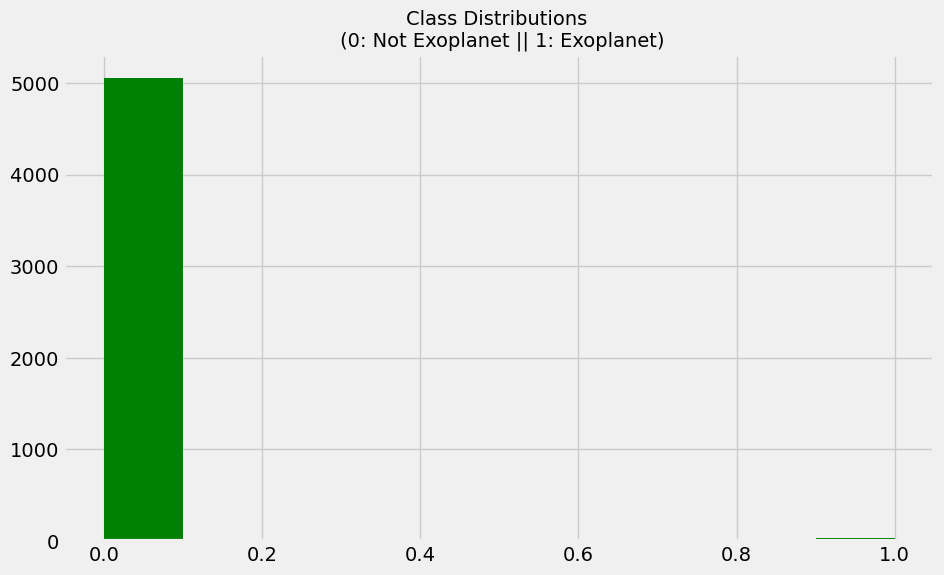

In [10]:
#ADDED LATER
colors = ['green']
plt.hist(train_data['LABEL'], histtype ='bar',
         color = colors,
         label =colors)

plt.title('Class Distributions \n (0: Not Exoplanet || 1: Exoplanet)', fontsize=14)


It turns out that the data is highly imbalanced so later on we'll be using some sampling techniques to balance the data.

### Plotting heatmap of missing values

In [11]:
#sns.heatmap(train_data)

<Axes: >

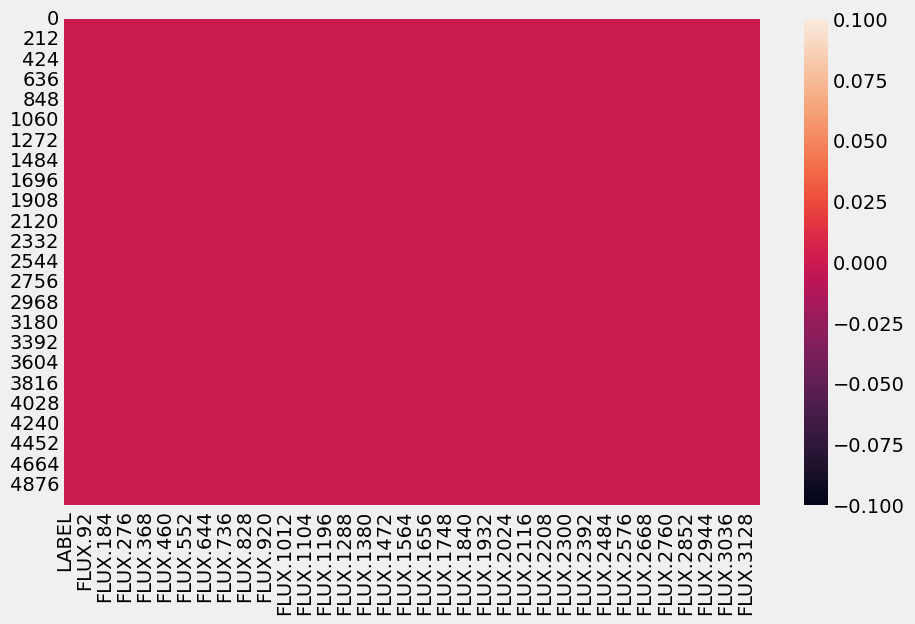

In [12]:
sns.heatmap(train_data.isnull())

# This gives a new data set same shape as the old data set but with boolean values of true or false. 
# This indicates whether each element is missing or not. 

We can clearly see that we dont have any missing values in our dataset.

**Flux :** the intensity of light recived from a planet

### Let us plot the first 4 rows of the train data and observe the intensity of flux values.

In [13]:
#(train_data.iloc[0,])


In [14]:
#train_data.iloc[-1] #from the back of the data set

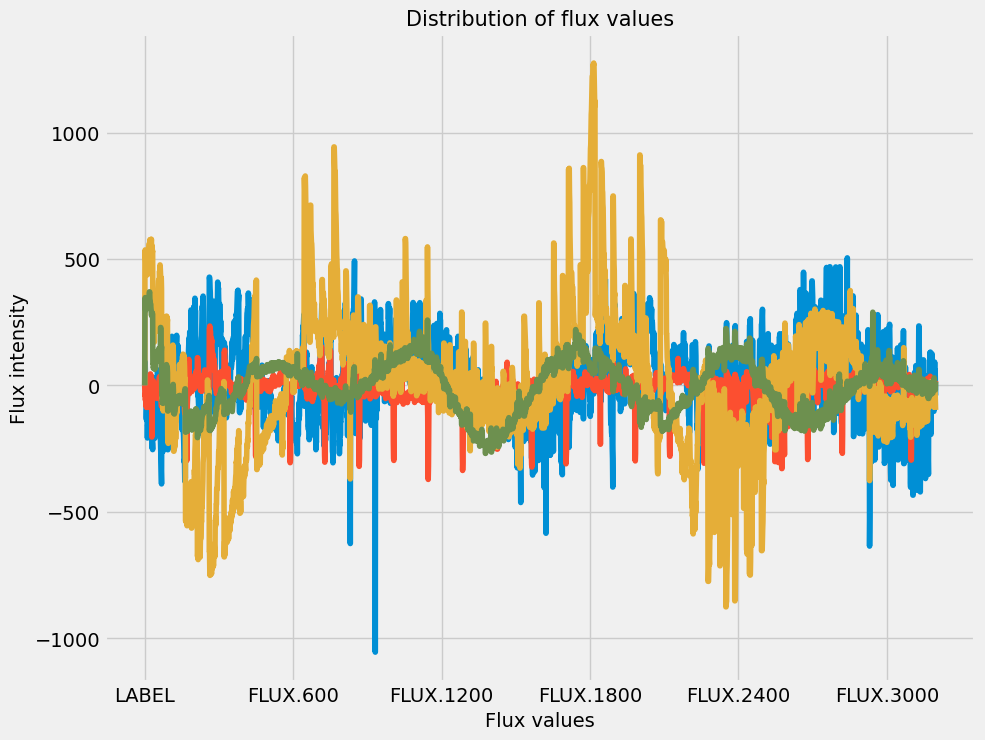

In [15]:
plt.figure(figsize=(10,8))
plt.title('Distribution of flux values', fontsize=15)
plt.xlabel('Flux values')
plt.ylabel('Flux intensity')
plt.plot(train_data.iloc[0,])
plt.plot(train_data.iloc[1,])
plt.plot(train_data.iloc[2,])
plt.plot(train_data.iloc[3,])

plt.xticks(np.arange(0, 3197, 600)) #this fixes the problem with too many ticks

plt.show()

### Plotting the correlation matrix

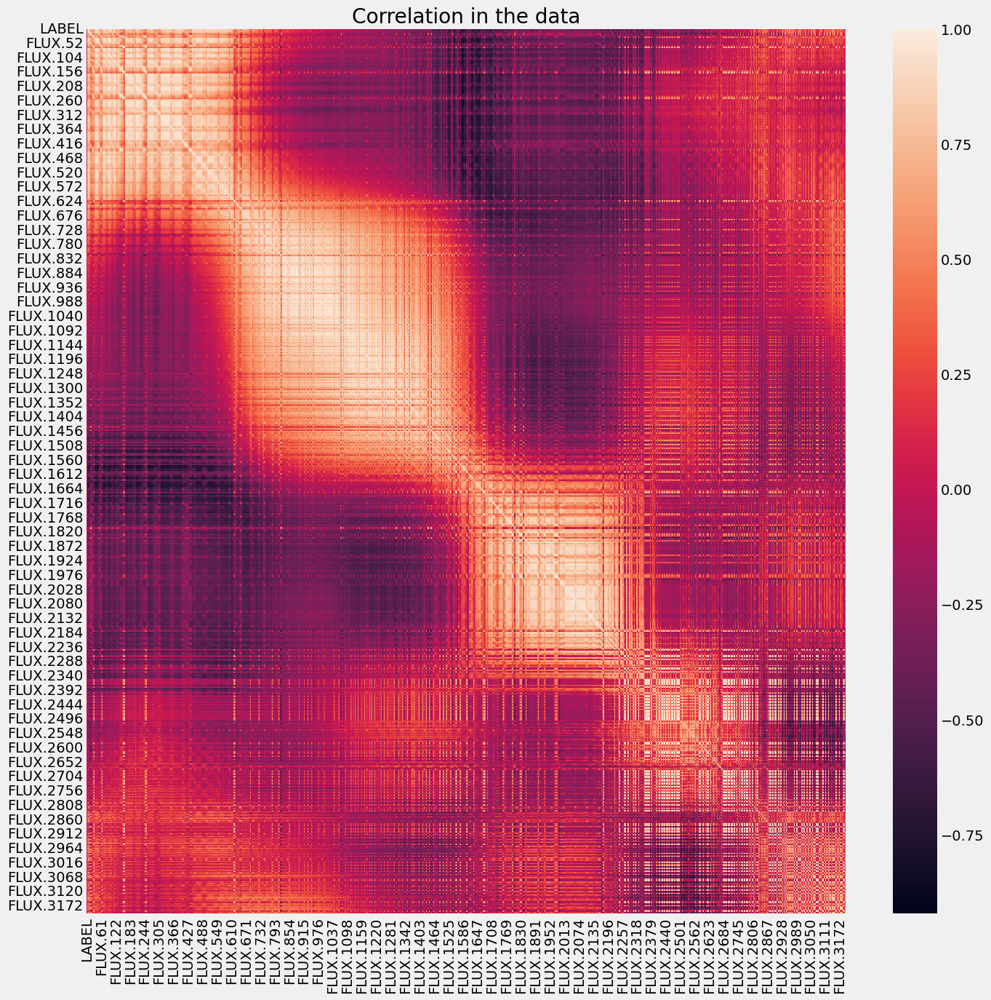

In [15]:
plt.figure(figsize=(15,15))
sns.heatmap(train_data.corr())
plt.title('Correlation in the data')
plt.show()

#Uses Pearson's correlation
# The correlation coefficient can take values between -1 and 1. 
# A value of 1 indicates a perfect positive linear correlation, -1 indicates a perfect negative linear correlation, 
# and 0 indicates no linear correlation.

### Each element of this matrix represents the correlation coefficient between the flux values of two different star systems at different points in time. The diagonal elements of the matrix represent the correlation coefficient of a star system with itself, which is always 1.

In [16]:
#corr = train_data.corr()

#plt.show()

### plot the Gaussian histogram of non-exoplanets data.

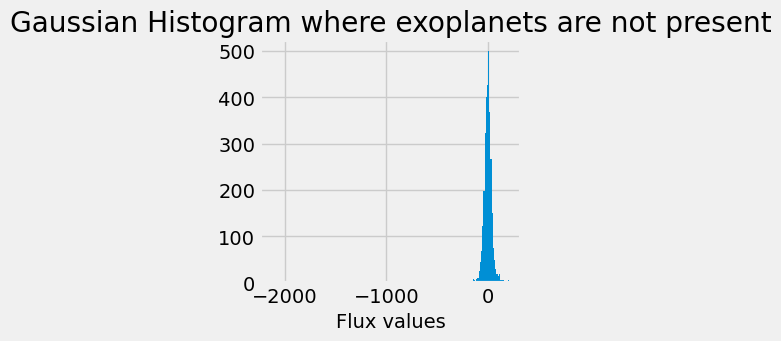

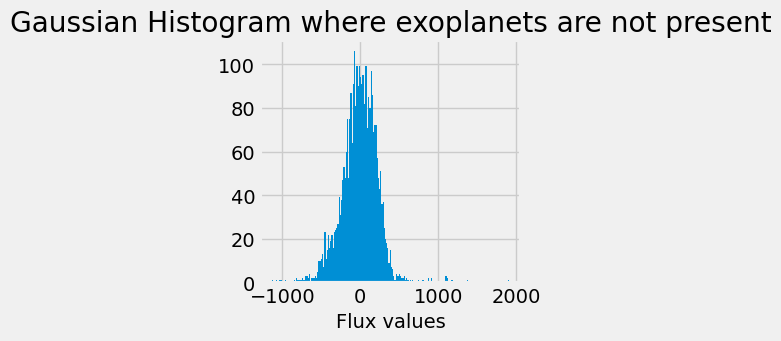

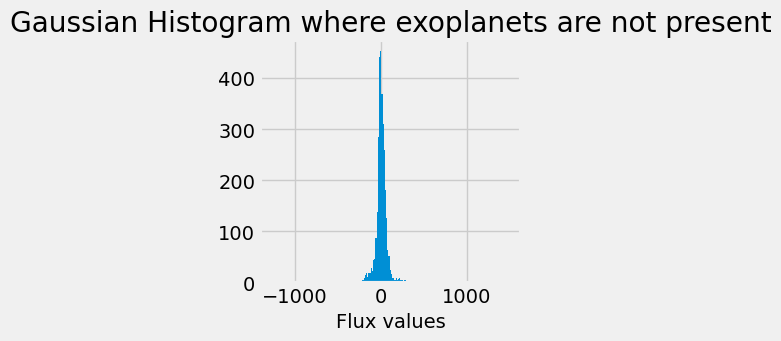

In [17]:
labels_1=[100,200,300]
for i in labels_1:
    plt.figure(figsize=(3,3))
    plt.hist(train_data.iloc[i,:], bins=200)
    plt.title("Gaussian Histogram where exoplanets are not present")
    plt.xlabel("Flux values")
    plt.show()

### plot Gaussian histogram of the data when exoplanets are present.

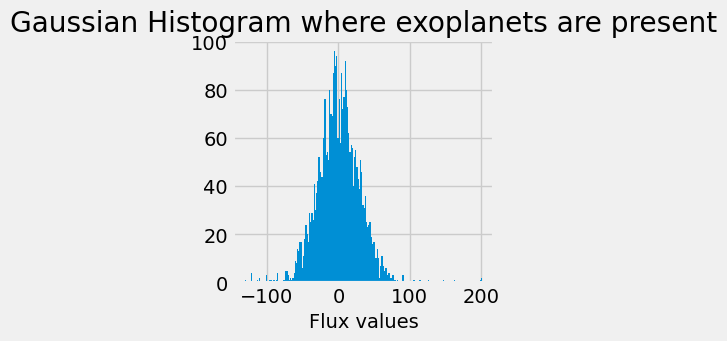

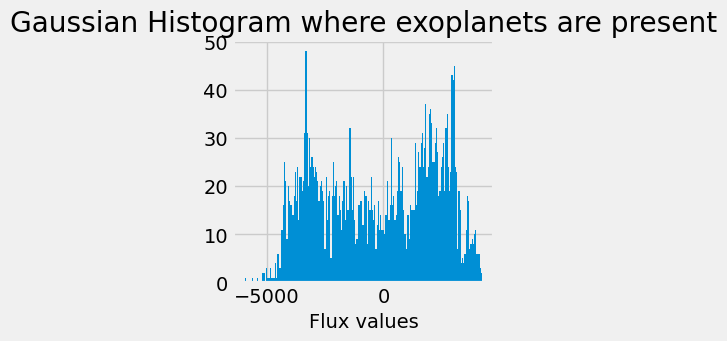

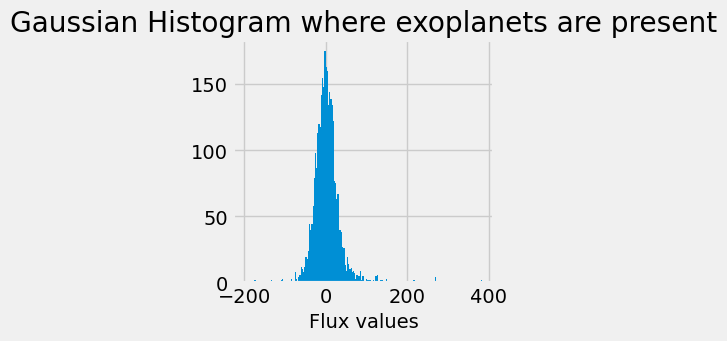

In [18]:
labels_1=[16,21,25]
for i in labels_1:
    plt.figure(figsize=(3,3))
    plt.hist(train_data.iloc[i,:], bins=200)
    plt.title("Gaussian Histogram where exoplanets are present")
    plt.xlabel("Flux values")
    plt.show()

### Detecting outliers using Boxplot

Box Plot is the visual representation of the depicting groups of numerical data through their quartiles. Boxplot is also used for detect the outlier in data set. It captures the summary of the data efficiently with a simple box and whiskers and allows us to compare easily across groups. Boxplot summarizes a sample data using 25th, 50th and 75th percentiles. 

<Axes: xlabel='LABEL', ylabel='FLUX.5'>

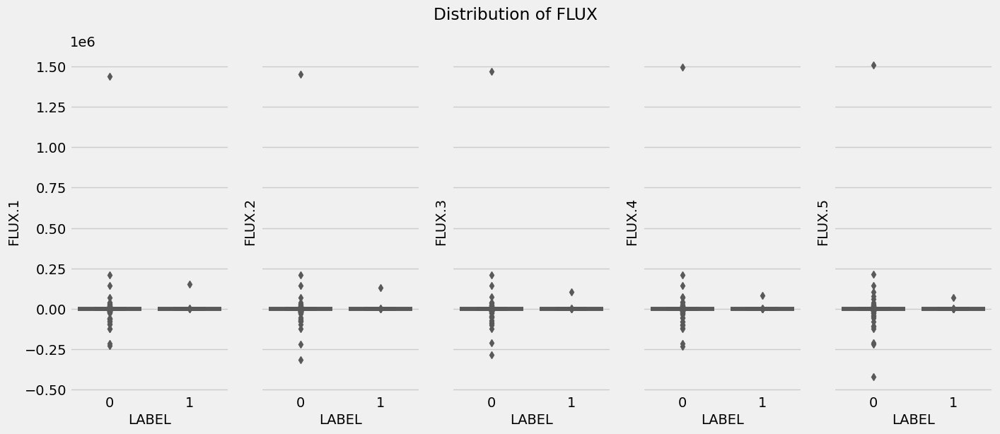

In [19]:
fig, axes = plt.subplots(1, 5,figsize=(15, 6), sharey=True)
fig.suptitle('Distribution of FLUX')

sns.boxplot(ax=axes[0], data=train_data, x='LABEL', y='FLUX.1',palette="Set2")
sns.boxplot(ax=axes[1], data=train_data, x='LABEL', y='FLUX.2',palette="Set2")
sns.boxplot(ax=axes[2], data=train_data, x='LABEL', y='FLUX.3',palette="Set2")
sns.boxplot(ax=axes[3], data=train_data, x='LABEL', y='FLUX.4',palette="Set2")
sns.boxplot(ax=axes[4], data=train_data, x='LABEL', y='FLUX.5',palette="Set2")


In [20]:
print('Dropping Outliers')
train_data.drop(train_data[train_data['FLUX.33']>250000].index, axis=0, inplace=True)

Dropping Outliers


In [21]:
len(train_data)

5086

### Split the dataset

So let us first split our dataset and normalize it.

In [22]:
x_train = train_data.drop(["LABEL"],axis=1) # dropping the exoplanet or not exoplanet column
y_train = train_data["LABEL"]               #Storing the label here
x_test = test_data.drop(["LABEL"],axis=1)
y_test = test_data["LABEL"]

### the training data is split into the labels and the rest of the data. 
### x_test or x_train stores the flux
### y_test or y_train stores the labels (0,1)

In [23]:
x_train

,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,FLUX.10,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
0,93.85,83.81,20.10,-26.98,-39.56,-124.71,-135.18,-96.27,-79.89,-160.17,...,-78.07,-102.15,-102.15,25.13,48.57,92.54,39.32,61.42,5.08,-39.54
1,-38.88,-33.83,-58.54,-40.09,-79.31,-72.81,-86.55,-85.33,-83.97,-73.38,...,-3.28,-32.21,-32.21,-24.89,-4.86,0.76,-11.70,6.46,16.00,19.93
2,532.64,535.92,513.73,496.92,456.45,466.00,464.50,486.39,436.56,484.39,...,-71.69,13.31,13.31,-29.89,-20.88,5.06,-11.80,-28.91,-70.02,-96.67
3,326.52,347.39,302.35,298.13,317.74,312.70,322.33,311.31,312.42,323.33,...,5.71,-3.73,-3.73,30.05,20.03,-12.67,-8.77,-17.31,-17.35,13.98
4,-1107.21,-1112.59,-1118.95,-1095.10,-1057.55,-1034.48,-998.34,-1022.71,-989.57,-970.88,...,-594.37,-401.66,-401.66,-357.24,-443.76,-438.54,-399.71,-384.65,-411.79,-510.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5082,-91.91,-92.97,-78.76,-97.33,-68.00,-68.24,-75.48,-49.25,-30.92,-11.88,...,139.95,147.26,156.95,155.64,156.36,151.75,-24.45,-17.00,3.23,19.28
5083,989.75,891.01,908.53,851.83,755.11,615.78,595.77,458.87,492.84,384.34,...,-26.50,-4.84,-76.30,-37.84,-153.83,-136.16,38.03,100.28,-45.64,35.58
5084,273.39,278.00,261.73,236.99,280.73,264.90,252.92,254.88,237.60,238.51,...,-26.82,-53.89,-48.71,30.99,15.96,-3.47,65.73,88.42,79.07,79.43
5085,3.82,2.09,-3.29,-2.88,1.66,-0.75,3.85,-0.03,3.28,6.29,...,10.86,-3.23,-5.10,-4.61,-9.82,-1.50,-4.65,-14.55,-6.41,-2.55


In [24]:
y_test

0      1
1      1
2      1
3      1
4      1
      ..
565    0
566    0
567    0
568    0
569    0
Name: LABEL, Length: 570, dtype: int64

### Data Normalization

**Data Normalization** is a technique often applied as part of data preparation for machine learning. The goal of normalization is to change the values of numeric columns in the dataset to a common scale, without distorting differences in the ranges of values.

In [25]:
x_train = normalized = normalize(x_train)
x_test = normalize(x_test)

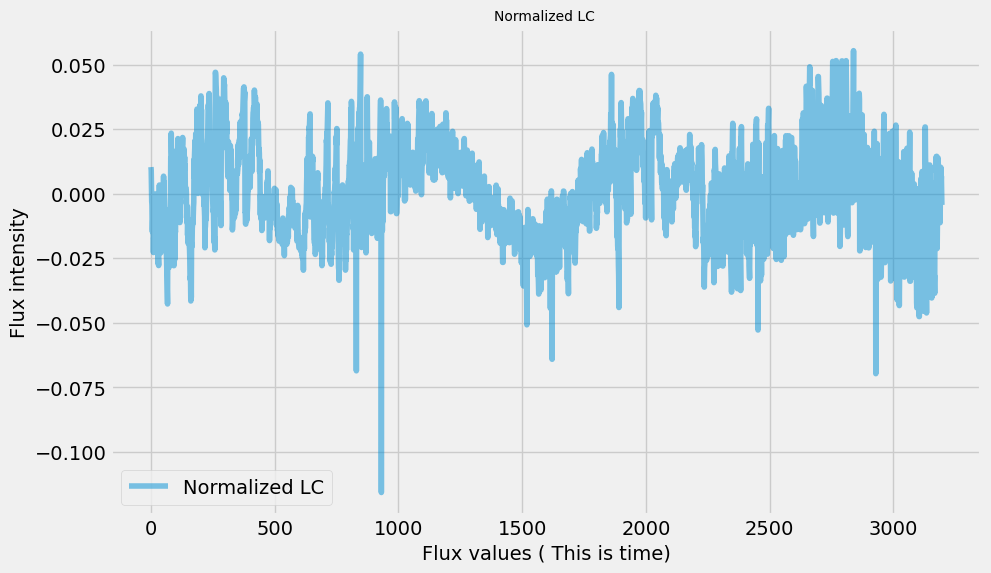

In [26]:
plt.plot(x_train[0],label='Normalized LC', alpha=0.5)
rcParams['figure.figsize'] = 13, 8
plt.title('Normalized LC ', fontsize=10)
plt.xlabel('Flux values ( This is time)')
plt.ylabel('Flux intensity')
plt.legend()

### Apply gaussian filters

The next step is to apply gaussian filters to both test and train.


In probability theory, the normal (or Gaussian or Gauss or Laplace–Gauss) distribution is a very common continuous probability distribution. Normal distributions are important in statistics and are often used in the natural and social sciences to represent real-valued random variables whose distributions are not known.

In [27]:
x_train = filtered = ndimage.filters.gaussian_filter(x_train, sigma=10)
x_test = ndimage.filters.gaussian_filter(x_test, sigma=10)

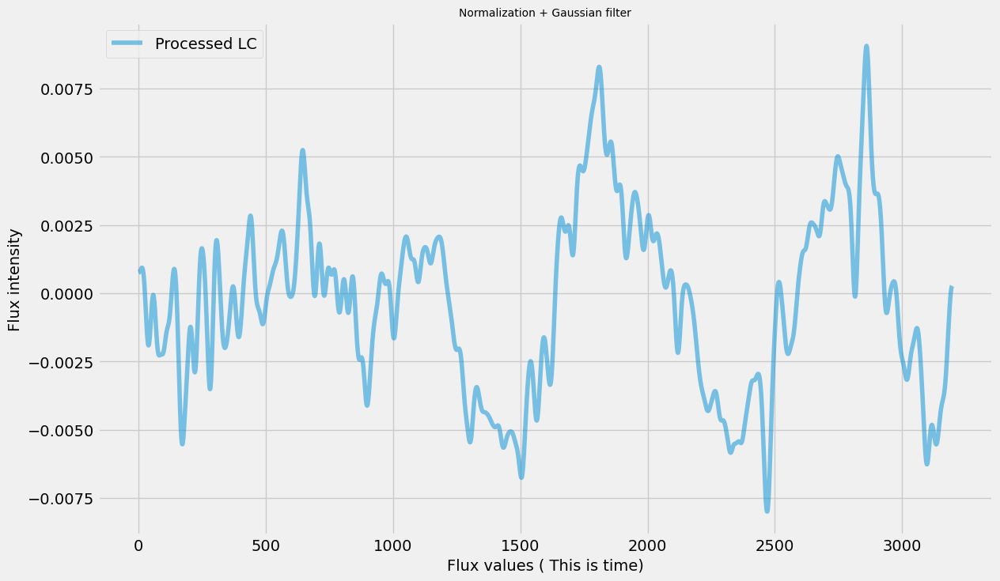

In [28]:
plt.plot(x_train[0],label='Processed LC', alpha=0.5)

rcParams['figure.figsize'] = 13, 8
plt.title('Normalization + Gaussian filter', fontsize=10)
plt.xlabel('Flux values ( This is time)')
plt.ylabel('Flux intensity')
plt.legend()

### This curve is smoother than the previous one

### Checking the SD and mean for the data that is normalized and then gaussian fitted

In [29]:
print("Mean of x_train=", x_train.mean())
print("Standard deviation of x_train=", x_train.std())
print("Mean of x_test=", x_test.mean())
print("Standard deviation of x_test=", x_test.std())

Mean of x_train= 0.00041115338341750845
Standard deviation of x_train= 0.0021012348915323735
Mean of x_test= 0.0005774804504573038
Standard deviation of x_test= 0.0020839390717288914


### So the mean is not 0 and SD is not unity. So we need to scale the data

### Feature scaling

we use feature scaling so that all the values remain in the comparable range.

In [30]:
#Feature scaling
# Documentation https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html

std_scaler = StandardScaler()
x_train = scaled = std_scaler.fit_transform(x_train)
x_test = std_scaler.fit_transform(x_test)

# Begining of a test

In [31]:
train_X_1, test_X_1, train_y_1, test_y_1 = train_test_split(x_train, y_train, test_size=0.33, random_state=42)

Validation accuracy of KNN is 1.0

Classification report :
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1666
           1       1.00      1.00      1.00        13

    accuracy                           1.00      1679
   macro avg       1.00      1.00      1.00      1679
weighted avg       1.00      1.00      1.00      1679



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

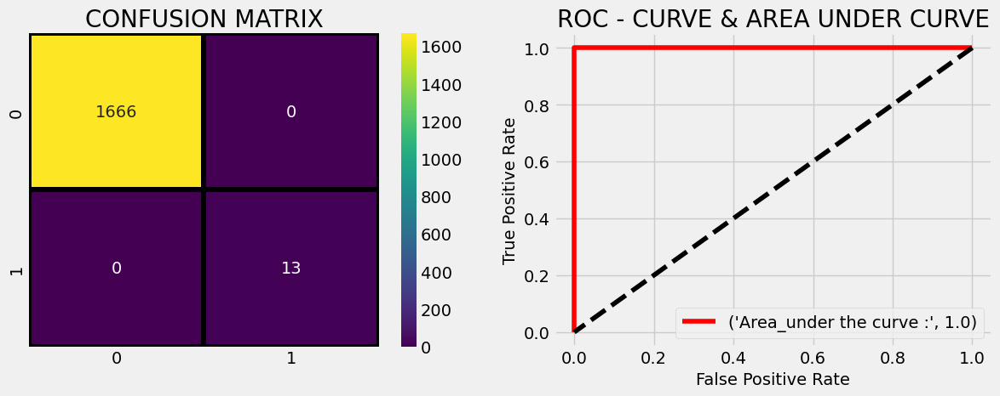

In [32]:
#K-NN  
#TEST
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier()  #Default k=5.  Determines the class of a test instance based on the class labels of its k nearest neighbors in the training dataset.

knn_model.fit(train_X_1,train_y_1)  #Fit the k-nearest neighbors classifier from the training dataset. (The classifier is then fitted to the training data using the fit method)
prediction=knn_model.predict(test_X_1)  #Predict the class labels for the provided data. (class labels of the test data are predicted using the predict method)
print('Validation accuracy of KNN is', accuracy_score(prediction,test_y_1))

#Documentation--- https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html
# we are trying to see how closely prediction and y_test data match


print ("\nClassification report :\n",(classification_report(test_y_1,prediction)))  
 
#Build a text report showing the main classification metrics.
#QUESTION why is there prediction first and y test later in accuracy score but opposite in classification?

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(test_y_1,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
#https://intellipaat.com/blog/roc-curve-in-machine-learning/


predicting_probabilites = knn_model.predict_proba(test_X_1)[:,1]  #Return probability estimates for the test data X.
fpr,tpr,thresholds = roc_curve(test_y_1,predicting_probabilites)

#fpr = false positive rate
#tpr = true positive rate

plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

# End test here. Delete later

# Model Building

# KNN

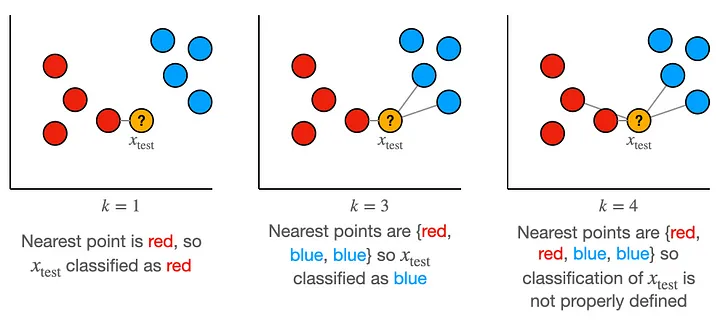

Credits : https://towardsdatascience.com/why-does-increasing-k-decrease-variance-in-knn-9ed6de2f5061

In [33]:
#K-NN
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier()  
# Default k=5.  Determines the class of a test instance based on the class labels 
# of its k nearest neighbors in the training dataset.

knn_model.fit(x_train,y_train)  
# Fit the k-nearest neighbors classifier from the training dataset. 
# (The classifier is then fitted to the training data using the fit method)


prediction=knn_model.predict(x_test)  
# Predict the class labels for the provided (test) data. 
# (class labels of the test data are predicted using the predict method)

print('Validation accuracy of KNN is', accuracy_score(y_test,prediction))

# Documentation--- https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html
# sklearn.metrics.accuracy_score(y_true, y_pred, *, normalize=True, sample_weight=None)

# Validation Score is calculated as the ratio of the number of correct predictions to the 
# total number of predictions made, usually expressed as a percentage. 
# In other words, it measures how often the classifier correctly predicts the class labels of the test instances.


print ("\nClassification report :\n",(classification_report(y_test,prediction)))  

# It provides precision, recall, f1-score, and support for each class in the target variable.
# The precision is the ratio of true positives to the sum of true and false positives, 
# while recall is the ratio of true positives to the sum of true positives and false negatives. 
# F1-score is the harmonic mean of precision and recall. Support is the number of observations for each class.


# Build a text report showing the main classification metrics.

Validation accuracy of KNN is 0.9912280701754386

Classification report :
               precision    recall  f1-score   support

           0       0.99      1.00      1.00       565
           1       0.00      0.00      0.00         5

    accuracy                           0.99       570
   macro avg       0.50      0.50      0.50       570
weighted avg       0.98      0.99      0.99       570



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

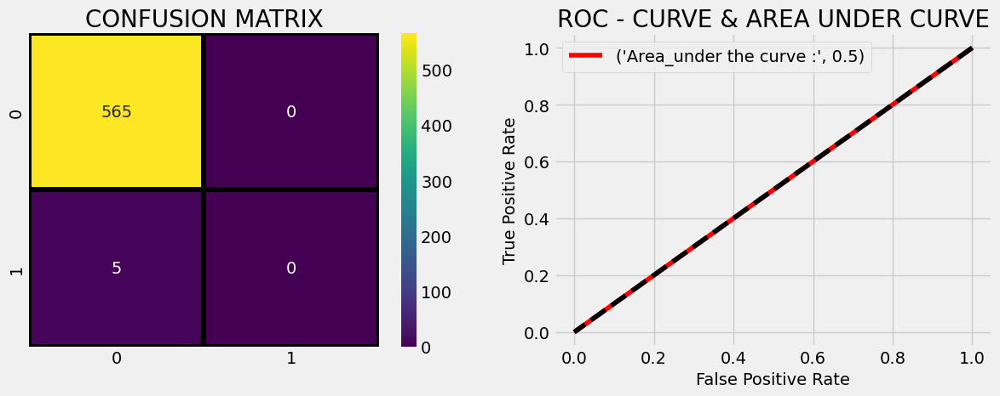

In [34]:
#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(y_test,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
#https://intellipaat.com/blog/roc-curve-in-machine-learning/


predicting_probabilites = knn_model.predict_proba(x_test)[:,1]  #Return probability estimates for the test data X.
fpr,tpr,thresholds = roc_curve(y_test,predicting_probabilites)

#fpr = false positive rate
#tpr = true positive rate

plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

# Logistic Regression

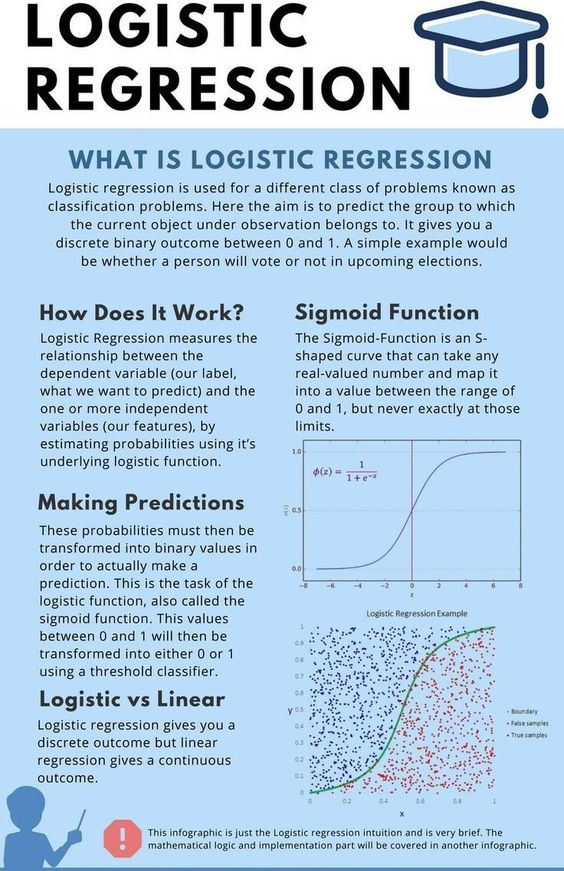

Credits: https://twitter.com/DataScienceDojo/status/1499784234088779796

In [35]:
#Logistic Regression
from sklearn.linear_model import LogisticRegression
lr_model = LogisticRegression(class_weight={0:100, 1:1}) 
# weight of 100 to class 0 and weight 1 to class 1. This implies that the model will be penalized 
# more for misclassifying instances from the minority class than for misclassifying instances from 
#the majority class.

lr_model.fit(x_train,y_train)   #Fit the model according to the given training data.

prediction=lr_model.predict(x_test)   #Predict class labels for samples in X.

print('Validation accuracy of Logistic Regression is', accuracy_score(prediction,y_test))
print ("\nClassification report :\n",(classification_report(y_test,prediction)))

Validation accuracy of Logistic Regression is 0.9842105263157894

Classification report :
               precision    recall  f1-score   support

           0       0.99      0.99      0.99       565
           1       0.00      0.00      0.00         5

    accuracy                           0.98       570
   macro avg       0.50      0.50      0.50       570
weighted avg       0.98      0.98      0.98       570



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

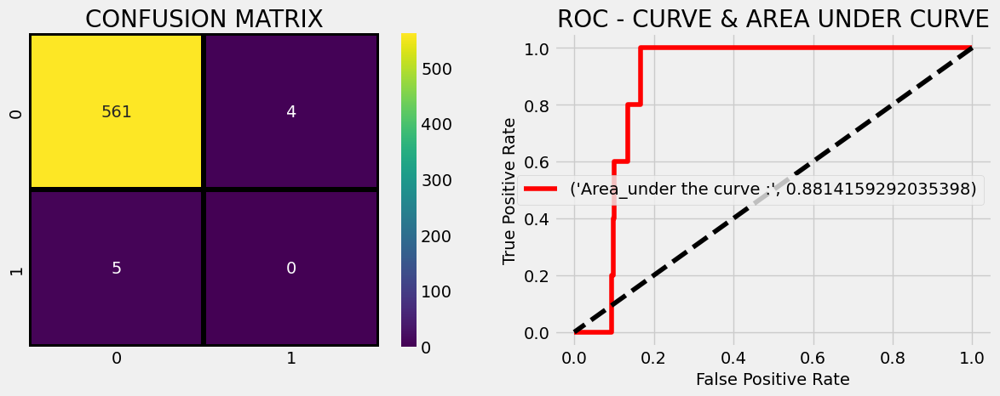

In [36]:
#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(y_test,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
#Receiver Operating Characteristic curve. 
#plot is used to visualise the performance of a binary classifier. It gives us the trade-off between the 
#True Positive Rate (TPR) and the False Positive Rate (FPR) at different classification thresholds.

predicting_probabilites = lr_model.predict_proba(x_test)[:,1]
fpr,tpr,thresholds = roc_curve(y_test,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

# Decision Tree

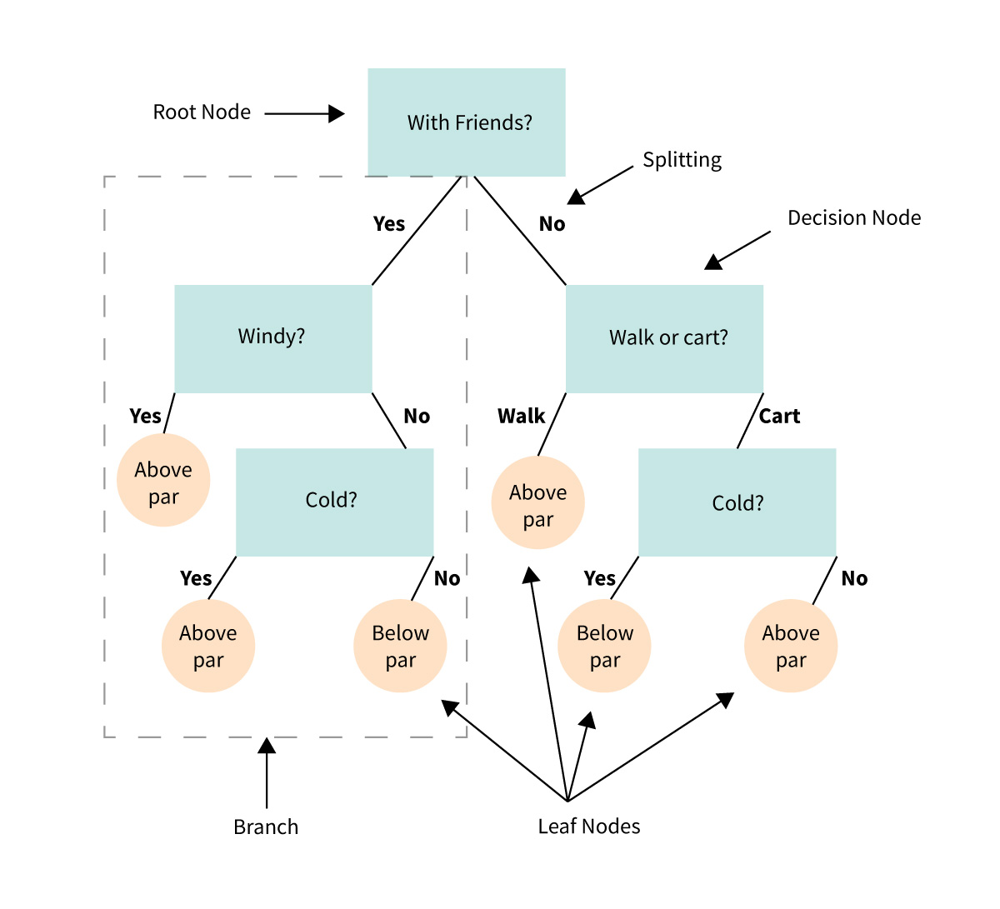

Credits: https://www.mastersindatascience.org/learning/machine-learning-algorithms/decision-tree/

# It is a tree-like model where each internal node represents a test on an attribute, each branch represents the outcome of the test, and each leaf node represents a class label or a value. 

In [38]:
#Decision Tree
from sklearn.tree import DecisionTreeClassifier
ds_model = DecisionTreeClassifier(max_depth=5, random_state=13)

ds_model.fit(x_train,y_train)

prediction=ds_model.predict(x_test)

print('Validation accuracy of Decision Tree is', accuracy_score(prediction,y_test))
print ("\nClassification report :\n",(classification_report(y_test,prediction)))
#print ("\nClassification report :\n",(classification_report(prediction, y_test)))

#The max_depth parameter is set to 5, which limits the maximum depth of the decision tree to 5 levels. 
# This is a hyperparameter. IS it a stopping criteria?
#This helps to prevent overfitting, where the model becomes too complex and fits the training data too closely, 
#resulting in poor generalization to new data.

#The random_state parameter is set to 13, which ensures that the results are reproducible. 
#It sets the random seed used by the model, so that the same random numbers are generated each time the code 
#is run.


Validation accuracy of Decision Tree is 0.9614035087719298

Classification report :
               precision    recall  f1-score   support

           0       0.99      0.97      0.98       565
           1       0.00      0.00      0.00         5

    accuracy                           0.96       570
   macro avg       0.50      0.48      0.49       570
weighted avg       0.98      0.96      0.97       570



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

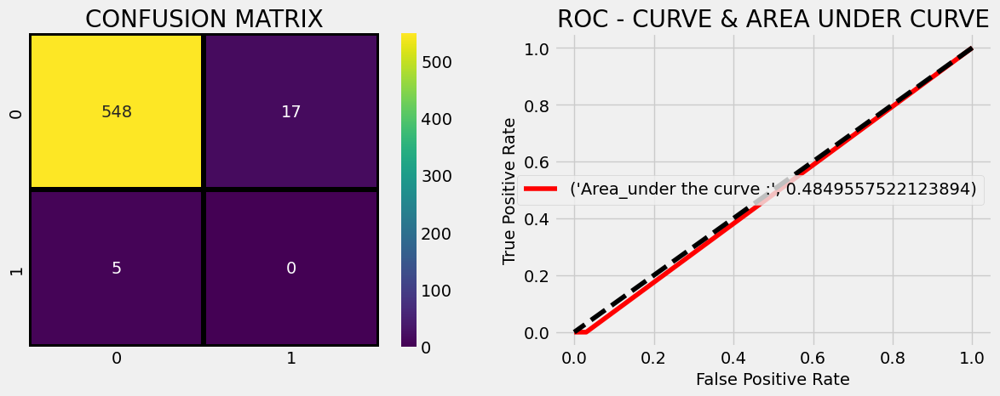

In [39]:
#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(y_test,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = ds_model.predict_proba(x_test)[:,1]
fpr,tpr,thresholds = roc_curve(y_test,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

### Balancing the class using SMOTE

**SMOTE** **(synthetic minority oversampling technique)** is one of the most commonly used oversampling methods to solve the imbalance problem. It aims to balance class distribution by randomly increasing minority class examples by replicating them. **SMOTE** synthesises new minority instances between existing minority instances.

### Split the dataset

<Axes: xlabel='index'>

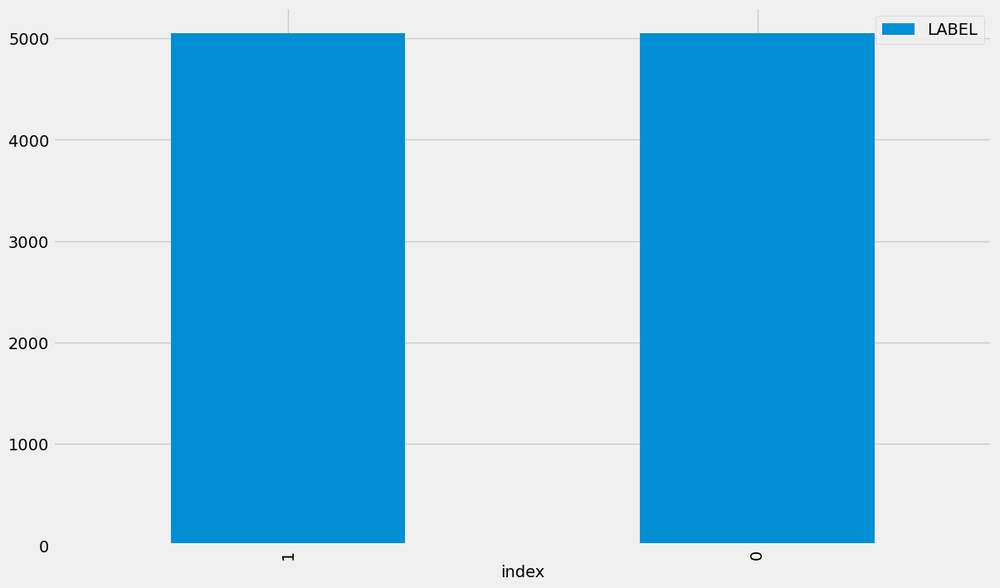

In [40]:
from imblearn.over_sampling import SMOTE
model = SMOTE()
ov_train_x,ov_train_y = model.fit_resample(train_data.drop('LABEL',axis=1), train_data['LABEL']) 
#oversample the minority class in the training data
#the initial command was model.fit_sample but that was giving an error 'SMOTE' object has no attribute 
#'fit_sample'. Changing it to model.fit_resample works

ov_train_y = ov_train_y.astype('int')

ov_train_y.value_counts().reset_index().plot(kind='bar', x='index', y='LABEL')


### We create new training and test data from the oversampled training data.

In [41]:
train_X, test_X, train_y, test_y = train_test_split(ov_train_x, ov_train_y, test_size=0.33, random_state=42)

In [42]:
len(train_y)

6765

### Below we use the Decision tree classifier to train the model using the training set obtained from the oversampled training data
### We use it on the test data obtained from the over sampled training data

Validation accuracy of Decision Tree is 0.9324932493249325

Classification report :
               precision    recall  f1-score   support

           0       0.97      0.89      0.93      1709
           1       0.90      0.97      0.93      1624

    accuracy                           0.93      3333
   macro avg       0.93      0.93      0.93      3333
weighted avg       0.94      0.93      0.93      3333



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

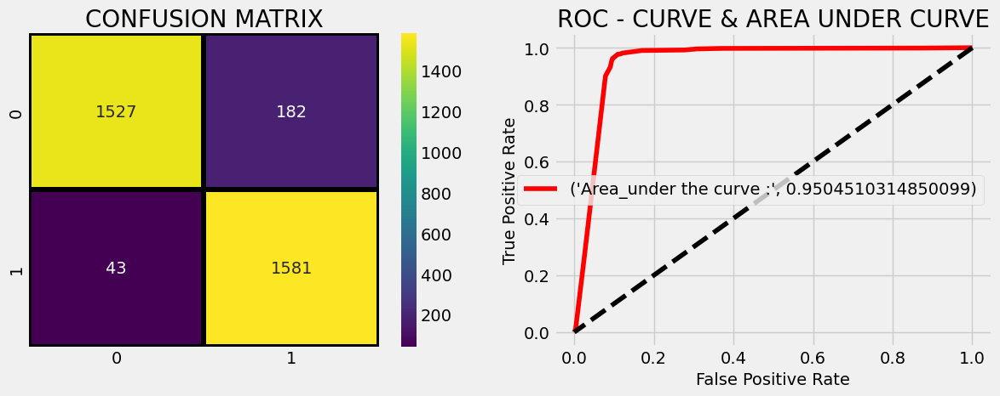

In [43]:
from sklearn.tree import DecisionTreeClassifier
ds_model = DecisionTreeClassifier(max_depth=5, random_state=13)

ds_model.fit(train_X,train_y)
#ds_model.fit(ov_train_x,ov_train_y) #Delete later

prediction=ds_model.predict(test_X)
#prediction=ds_model.predict(x_test)   #delete later

print('Validation accuracy of Decision Tree is', accuracy_score(prediction,test_y))
print ("\nClassification report :\n",(classification_report(test_y,prediction)))

#print('Validation accuracy of Decision Tree is', accuracy_score(prediction,y_test)) #delete later
#print ("\nClassification report :\n",(classification_report(y_test,prediction)))  #delete later


#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(test_y,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)

#sns.heatmap(confusion_matrix(y_test,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)

plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = ds_model.predict_proba(test_X)[:,1]
fpr,tpr,thresholds = roc_curve(test_y,predicting_probabilites)

#predicting_probabilites = ds_model.predict_proba(x_test)[:,1]  #delete later
#fpr,tpr,thresholds = roc_curve(y_test,predicting_probabilites)  #delete later

plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

Validation accuracy of KNN is 0.9822982298229823

Classification report :
               precision    recall  f1-score   support

           0       1.00      0.97      0.98      1709
           1       0.96      1.00      0.98      1624

    accuracy                           0.98      3333
   macro avg       0.98      0.98      0.98      3333
weighted avg       0.98      0.98      0.98      3333



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

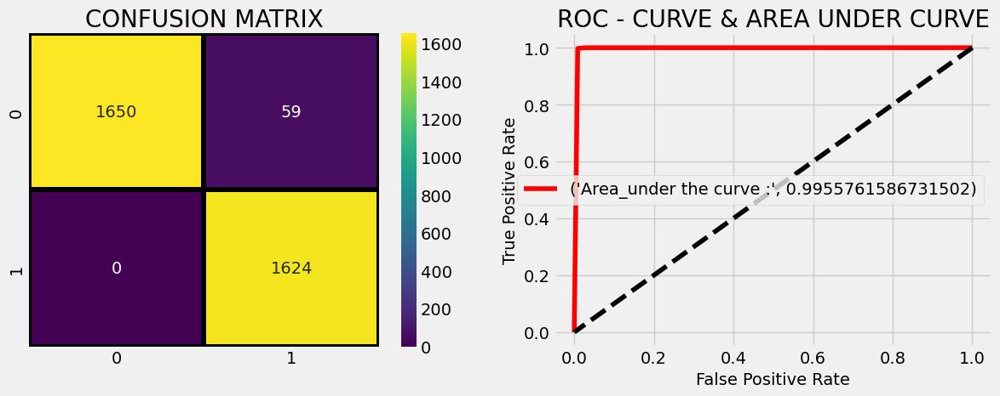

In [44]:
knn_model = KNeighborsClassifier()

knn_model.fit(train_X,train_y)

prediction=knn_model.predict(test_X)

print('Validation accuracy of KNN is', accuracy_score(test_y,prediction))
print ("\nClassification report :\n",(classification_report(test_y,prediction)))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(test_y,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = knn_model.predict_proba(test_X)[:,1]
fpr,tpr,thresholds = roc_curve(test_y,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

Validation accuracy of Logistic Regression is 0.7167716771677167

Classification report :
               precision    recall  f1-score   support

           0       0.75      0.67      0.71      1709
           1       0.69      0.77      0.73      1624

    accuracy                           0.72      3333
   macro avg       0.72      0.72      0.72      3333
weighted avg       0.72      0.72      0.72      3333



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

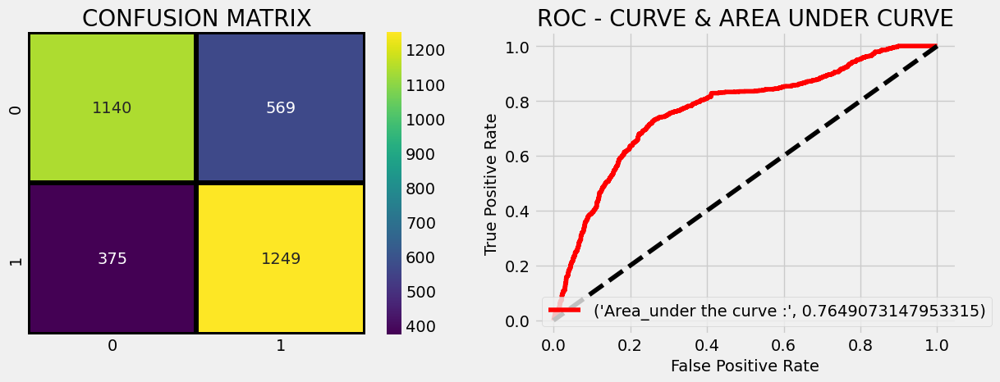

In [44]:
lr_model = LogisticRegression(class_weight={0:100, 1:1})

lr_model.fit(train_X,train_y)

prediction=lr_model.predict(test_X)

print('Validation accuracy of Logistic Regression is', accuracy_score(test_y,prediction))
print ("\nClassification report :\n",(classification_report(test_y,prediction)))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(test_y,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = lr_model.predict_proba(test_X)[:,1]
fpr,tpr,thresholds = roc_curve(test_y,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

As we can observe after applying SMOTE to balance the classes, our ML models are performing really good.